In [30]:
library('ggplot2')
library('reshape2')
library('ggpubr')
library(glmnet)
library(doMC)
library(survival)
library(data.table)
library(mltools)
library(CoxBoost)
library(randomForestSRC)
library(CoxHD)
library(Hmisc)
library(gridExtra)
library("survminer")
library(dplyr)
library(stringr)

source("../../../../src/tools.R")
options(repr.plot.res        = 100, # set a medium-definition resolution for the jupyter notebooks plots (DPI)
        repr.matrix.max.rows = 250, # set the maximum number of rows displayed
        repr.matrix.max.cols = 250) # set the maximum number of columns displayed

# BOOTSTRAPING FOR FEATURE IMPORTANCE

In [31]:
df_bootstrap <- NULL
for (l in list.files('../Bootstrap_coef/')){
    if (grepl("_bootstrap",l)){
        if(grepl("_bootstrap_SVM",l)){
            df_tmp <- read.table(paste('../Bootstrap_coef/',l,sep=""),sep=',',header=T)
            df_tmp <- df_tmp[,-1]
            df_tmp <- df_tmp[,c(2,1,3)]
        } else {
            df_tmp <- read.table(paste('../Bootstrap_coef/',l,sep=""))
        }
        colnames(df_tmp) <- c("feature","sum_coef","num_selected")
        df_tmp$model_algo <- str_sub(l, 1, str_length(l)-4)
        df_bootstrap <- rbind(df_bootstrap,df_tmp)   
    }
}
df_bootstrap <- df_bootstrap[df_bootstrap$feature!="age.1" & !is.na(df_bootstrap$feature),]
dim(df_bootstrap)
#df_bootstrap[df_bootstrap$feature=="age",]

[1] 14949     4

In [53]:
### Some Prep
df_final <- read.table("../data_frame_final_prognosis.tsv")

eln <- colnames(df_final[1])
comp <- colnames(df_final[,c(164:178)])
age <- colnames(df_final[163])
all_gen <- c(2:85)
vect <- apply(X=df_final[,all_gen],2,FUN=function(x) 100*length(which(x==1))/dim(df_final)[1])
gen <- colnames(df_final[,match(names(vect[vect>=2]),names(df_final))])
all_cyto <- c(86:154)
vect <- apply(X=df_final[,all_cyto],2,FUN=function(x) 100*length(which(x==1))/dim(df_final)[1])
cyto <- colnames(df_final[,match(names(vect[vect>=2]),names(df_final))])
clin <- colnames(df_final[,c(155:161)])
gender <- colnames(df_final[162])
demo <- colnames(df_final[,162:163])

# I ALL MODELS AND ALGORITHMS )
# I.1)Get Proportion of overall models and algorithms variable importance

In [54]:
# Count number of times each variable can appear in a model .
count_eln <- 0
count_clin <- 0
count_gen <- 0
count_cyto <- 0
count_comp <- 0
count_gender <- 0
count_age <-0
for (l in list.files('../Bootstrap_coef/')){
    if (grepl("eln_age_gen_demo",l) | grepl("eln_comp_age_gen_demo",l)){
        ##
    }else{
        if (grepl("eln",l) & !grepl("reduced",l) ){
            count_eln <-count_eln + 1
        }
        if (grepl("clin",l) & !grepl("reduced",l) ){
            count_clin <-count_clin + 1
        }
        if (grepl("gen",l) & !grepl("reduced",l) ){
            count_gen <-count_gen + 1
        }
        if (grepl("cyto",l) & !grepl("reduced",l) ){
            count_cyto <-count_cyto + 1
        }
        if (grepl("comp",l) & !grepl("reduced",l) ){
            count_comp <-count_comp + 1
        }
        if (grepl("demo",l) & !grepl("reduced",l) ){
            count_gender <-count_gender + 1
        }
        if ((grepl("age",l) | grepl("demo",l))   & !grepl("reduced",l) & !grepl("without_age",l)){
            count_age <-count_age + 1
        }
    }
    }

#Same count but for glm models for coeff interpretation
cat("eln",count_eln,"\n") 
cat("clin",count_clin,"\n") 
cat("gen",count_gen,"\n" )
cat("cyto",count_cyto,"\n") 
cat("comp",count_comp,"\n") 
cat("count_gender",gender,"\n") 
cat("age",count_age) 



eln_comp_gen_cyto_clin_demo <- c(eln,comp,gen,cyto,clin,demo)
all<- df_bootstrap[!(grepl("eln_age_gen_demo",df_bootstrap$model_algo) | grepl("eln_comp_age_gen_demo",df_bootstrap$model_algo)),]
all <- all[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)       
all$proportion_selected <- ifelse(is.element(all$feature , gen),all$num_selected/count_gen,
                                 ifelse(is.element(all$feature,cyto),all$num_selected/count_cyto,
                                       ifelse(is.element(all$feature,clin),all$num_selected/count_clin,
                                             ifelse(is.element(all$feature,comp),all$num_selected/count_comp,
                                                   ifelse(is.element(all$feature,eln),all$num_selected/count_eln,
                                                       ifelse(is.element(all$feature,gender),all$num_selected/count_gender,
                                                             ifelse(is.element(all$feature,age),all$num_selected/count_age,0)))))))

eln 262 
clin 160 
gen 184 
cyto 166 
comp 196 
count_gender gender 
age 216

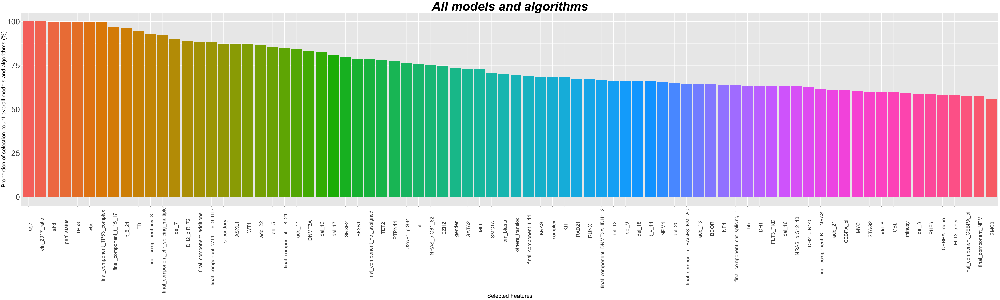

In [55]:
set_notebook_plot_size(50,15)
ggplot(na.omit(all),aes(x=reorder(feature,-proportion_selected),y=proportion_selected))+geom_bar(stat = "identity", aes(fill = reorder(feature,-proportion_selected)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Proportion of selection count overall models and algorithms (%)") + ggtitle("All models and algorithms")



# I.2) PROPORTION + COEFFICIENTS OVER ALL MODELS FOR GLM ALGORITHMS

In [56]:
count_eln_glm <- 0
count_clin_glm <- 0
count_gen_glm <- 0
count_cyto_glm <- 0
count_comp_glm <- 0
count_gender_glm <- 0
count_age_glm <-0

for (l in list.files('../Bootstrap_coef/')){
    if (grepl("eln_age_gen_demo",l) | grepl("eln_comp_age_gen_demo",l)){
        ##
    }else{
        if (grepl("eln",l) & grepl("glm",l) & !grepl("reduced",l) ){
            count_eln_glm <-count_eln_glm + 1
        }
        if (grepl("clin",l) & grepl("glm",l) & !grepl("reduced",l) ){
            count_clin_glm <-count_clin_glm + 1
        }
        if (grepl("gen",l) & grepl("glm",l) & !grepl("reduced",l) ){
            count_gen_glm <-count_gen_glm + 1
        }
        if (grepl("cyto",l) & grepl("glm",l) & !grepl("reduced",l) ){
            count_cyto_glm <-count_cyto_glm + 1
        }
        if (grepl("comp",l) & grepl("glm",l) & !grepl("reduced",l) ){
            count_comp_glm <-count_comp_glm + 1
        }
        if (grepl("demo",l) & grepl("glm",l) & !grepl("reduced",l) ){
            count_gender_glm <-count_gender_glm + 1
        }
        if ((grepl("age",l) | grepl("demo",l)) & grepl("glm",l) & !grepl("reduced",l) & !grepl("without_age",l)){
            count_age_glm <-count_age_glm + 1
        }
    }
    }

cat("eln",count_eln_glm,"\n")
cat("clin",count_clin_glm,"\n")
cat("gen",count_gen_glm,"\n")
cat("cyto",count_cyto_glm,"\n")
cat("comp",count_comp_glm,"\n")
cat("gender",count_gender_glm,"\n")
cat("age",count_age_glm)

all_glm <- df_bootstrap[grepl("glm",df_bootstrap$model_algo) & !(grepl("eln_age_gen_demo",df_bootstrap$model_algo) | grepl("eln_comp_age_gen_demo",df_bootstrap$model_algo)),]
all_glm <- all_glm[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
all_glm$proportion_selected <- ifelse(is.element(all_glm$feature , gen),all_glm$num_selected/count_gen_glm,
                                 ifelse(is.element(all_glm$feature,cyto),all_glm$num_selected/count_cyto_glm,
                                       ifelse(is.element(all_glm$feature,clin),all_glm$num_selected/count_clin_glm,
                                             ifelse(is.element(all_glm$feature,comp),all_glm$num_selected/count_comp_glm,
                                                   ifelse(is.element(all_glm$feature,eln),all_glm$num_selected/count_eln_glm,
                                                       ifelse(is.element(all_glm$feature,gender),all_glm$num_selected/count_gender_glm,
                                                             ifelse(is.element(all_glm$feature,age),all_glm$num_selected/count_age_glm,0)))))))

all_glm$proportion_coefficients <- ifelse(is.element(all_glm$feature , gen),all_glm$sum_coef/count_gen_glm,
                                 ifelse(is.element(all_glm$feature,cyto),all_glm$sum_coef/count_cyto_glm,
                                       ifelse(is.element(all_glm$feature,clin),all_glm$sum_coef/count_clin_glm,
                                             ifelse(is.element(all_glm$feature,comp),all_glm$sum_coef/count_comp_glm,
                                                   ifelse(is.element(all_glm$feature,eln),all_glm$sum_coef/count_eln_glm,
                                                       ifelse(is.element(all_glm$feature,gender),all_glm$sum_coef/count_gender_glm,
                                                             ifelse(is.element(all_glm$feature,age),all_glm$sum_coef/count_age_glm,0)))))))


eln 132 
clin 81 
gen 93 
cyto 84 
comp 99 
gender 93 
age 108

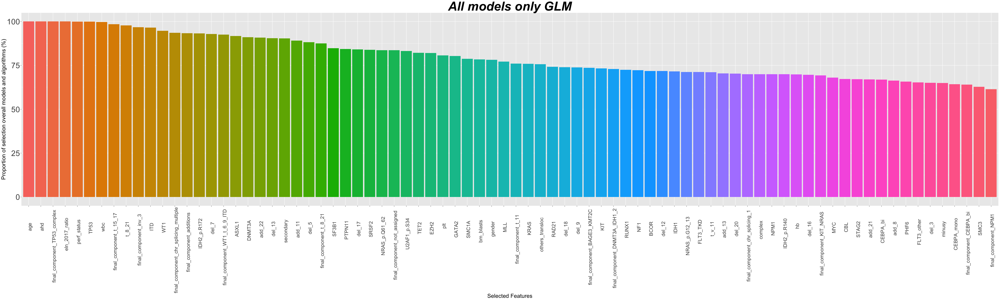

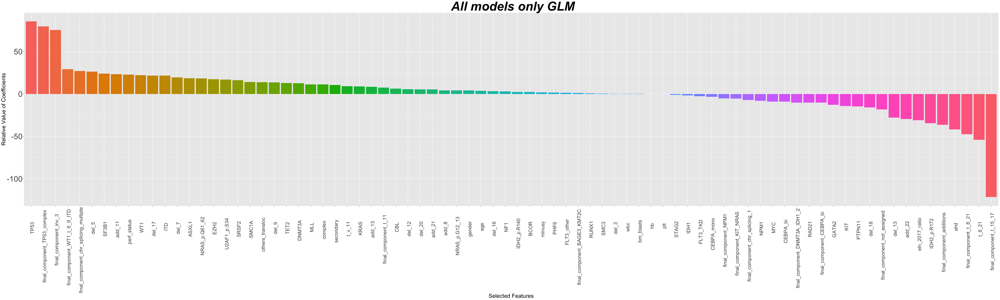

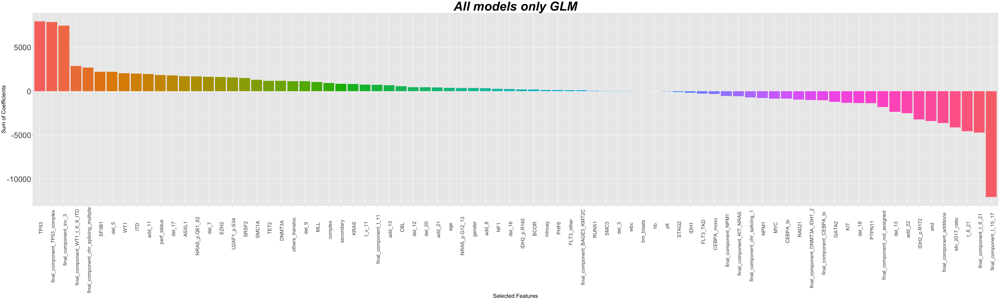

In [57]:
set_notebook_plot_size(50,15)
ggplot(na.omit(all_glm),aes(x=reorder(feature,-proportion_selected),y=proportion_selected))+geom_bar(stat = "identity", aes(fill = reorder(feature,-proportion_selected)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Proportion of selection overall models and algorithms (%)") + ggtitle("All models only GLM")

ggplot(na.omit(all_glm),aes(x=reorder(feature,-proportion_coefficients),y=proportion_coefficients))+geom_bar(stat = "identity", aes(fill = reorder(feature,-proportion_coefficients)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Relative Value of Coefficients") + ggtitle(" All models only GLM")

ggplot(na.omit(all_glm),aes(x=reorder(feature,-sum_coef),y=sum_coef))+geom_bar(stat = "identity", aes(fill = reorder(feature,-sum_coef)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Sum of Coefficients") + ggtitle("All models only GLM")


# II ALL THE MODELS WHERE AGE IS NOT INCLUDED )
# II.1)Variable importance

In [58]:
count_eln_without_age <- 0
count_clin_without_age <- 0
count_gen_without_age <- 0
count_cyto_without_age <- 0
count_comp_without_age <- 0
count_gender_without_age <- 0



for (l in list.files('../Bootstrap_coef/')){
    if(!((grepl("age",l) | grepl("demo",l)) &  !grepl("without_age",l))){
        
        if (grepl("eln",l) & !grepl("reduced",l) ){
            count_eln_without_age <-count_eln_without_age + 1
        }
        if (grepl("clin",l) & !grepl("reduced",l) ){
            count_clin_without_age <-count_clin_without_age + 1
        }
        if (grepl("gen",l) & !grepl("reduced",l) ){
            count_gen_without_age <-count_gen_without_age + 1
        }
        if (grepl("cyto",l) & !grepl("reduced",l) ){
            count_cyto_without_age <-count_cyto_without_age + 1
        }
        if (grepl("comp",l) & !grepl("reduced",l) ){
            count_comp_without_age <-count_comp_without_age + 1
        }
        if (grepl("demo",l) & !grepl("reduced",l) ){
            count_gender_without_age <-count_gender_without_age + 1
        }
    }
    }

cat("eln",count_eln_without_age,"\n")
cat("clin",count_clin_without_age,"\n")
cat("gen",count_gen_without_age,"\n")
cat("cyto",count_cyto_without_age,"\n")
cat("comp",count_comp_without_age,"\n")
cat("gender",count_gender_without_age)


all_without_age <- df_bootstrap[!((grepl("age",df_bootstrap$model_algo) | grepl("demo",df_bootstrap$model_algo)) &  !grepl("without_age",df_bootstrap$model_algo)),]
all_without_age<- all_without_age[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
all_without_age$proportion_selected <- ifelse(is.element(all_without_age$feature , gen),all_without_age$num_selected/count_gen_without_age,
                                 ifelse(is.element(all_without_age$feature,cyto),all_without_age$num_selected/count_cyto_without_age,
                                       ifelse(is.element(all_without_age$feature,clin),all_without_age$num_selected/count_clin_without_age,
                                             ifelse(is.element(all_without_age$feature,comp),all_without_age$num_selected/count_comp_without_age,
                                                   ifelse(is.element(all_without_age$feature,eln),all_without_age$num_selected/count_eln_without_age,
                                                       ifelse(is.element(all_without_age$feature,gender),all_without_age$num_selected/count_gender_without_age,0))))))


eln 130 
clin 76 
gen 88 
cyto 82 
comp 106 
gender 64

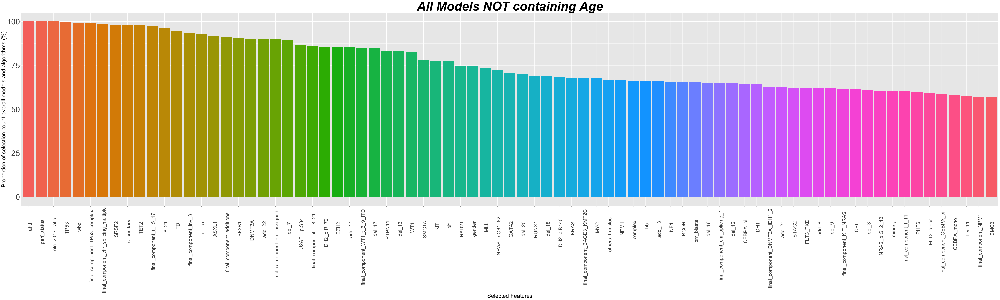

In [59]:
set_notebook_plot_size(50,15)
ggplot(na.omit(all_without_age),aes(x=reorder(feature,-proportion_selected),y=proportion_selected))+geom_bar(stat = "identity", aes(fill = reorder(feature,-proportion_selected)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Proportion of selection count overall models and algorithms (%)") + ggtitle("All Models NOT containing Age")


In [60]:
count_eln_glm_without_age <- 0
count_clin_glm_without_age <- 0
count_gen_glm_without_age <- 0
count_cyto_glm_without_age <- 0
count_comp_glm_without_age <- 0
count_gender_glm_without_age <- 0


for (l in list.files('../Bootstrap_coef/')){
    if(!((grepl("age",l) | grepl("demo",l)) &  !grepl("without_age",l))){
        
        if (grepl("eln",l) & grepl("glm",l) & !grepl("reduced",l) ){
            count_eln_glm_without_age <-count_eln_glm_without_age + 1
        }
        if (grepl("clin",l) & grepl("glm",l) & !grepl("reduced",l) ){
            count_clin_glm_without_age <-count_clin_glm_without_age + 1
        }
        if (grepl("gen",l) & grepl("glm",l) & !grepl("reduced",l) ){
            count_gen_glm_without_age <-count_gen_glm_without_age + 1
        }
        if (grepl("cyto",l) & grepl("glm",l) & !grepl("reduced",l) ){
            count_cyto_glm_without_age <-count_cyto_glm_without_age + 1
        }
        if (grepl("comp",l) & grepl("glm",l) & !grepl("reduced",l) ){
            count_comp_glm_without_age <-count_comp_glm_without_age + 1
        }
        if (grepl("demo",l) & grepl("glm",l) & !grepl("reduced",l) ){
            count_gender_glm_without_age <-count_gender_glm_without_age + 1
        }
    }
    }


cat("eln",count_eln_glm_without_age,"\n")
cat("clin",count_clin_glm_without_age,"\n")
cat("gen",count_gen_glm_without_age,"\n")
cat("cyto",count_cyto_glm_without_age,"\n")
cat("comp",count_comp_glm_without_age,"\n")
cat("gender",count_gender_glm_without_age)


all_glm_without_age <- df_bootstrap[grepl("glm",df_bootstrap$model_algo) & !((grepl("age",df_bootstrap$model_algo) | grepl("demo",df_bootstrap$model_algo)) &  !grepl("without_age",df_bootstrap$model_algo)),]
all_glm_without_age <- all_glm_without_age[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
all_glm_without_age$proportion_selected <- ifelse(is.element(all_glm_without_age$feature , gen),all_glm_without_age$num_selected/count_gen_glm_without_age,
                                 ifelse(is.element(all_glm_without_age$feature,cyto),all_glm_without_age$num_selected/count_cyto_glm_without_age,
                                       ifelse(is.element(all_glm_without_age$feature,clin),all_glm_without_age$num_selected/count_clin_glm_without_age,
                                             ifelse(is.element(all_glm_without_age$feature,comp),all_glm_without_age$num_selected/count_comp_glm_without_age,
                                                   ifelse(is.element(all_glm_without_age$feature,eln),all_glm_without_age$num_selected/count_eln_glm_without_age,
                                                       ifelse(is.element(all_glm_without_age$feature,gender),all_glm_without_age$num_selected/count_gender_glm_without_age,0))))))

all_glm_without_age$proportion_coefficients <- ifelse(is.element(all_glm_without_age$feature , gen),all_glm_without_age$sum_coef/count_gen_glm_without_age,
                                 ifelse(is.element(all_glm_without_age$feature,cyto),all_glm_without_age$sum_coef/count_cyto_glm_without_age,
                                       ifelse(is.element(all_glm_without_age$feature,clin),all_glm_without_age$sum_coef/count_clin_glm_without_age,
                                             ifelse(is.element(all_glm_without_age$feature,comp),all_glm_without_age$sum_coef/count_comp_glm_without_age,
                                                   ifelse(is.element(all_glm_without_age$feature,eln),all_glm_without_age$sum_coef/count_eln_glm_without_age,
                                                       ifelse(is.element(all_glm_without_age$feature,gender),all_glm_without_age$sum_coef/count_gender_glm_without_age,0))))))


eln 66 
clin 39 
gen 45 
cyto 42 
comp 54 
gender 33

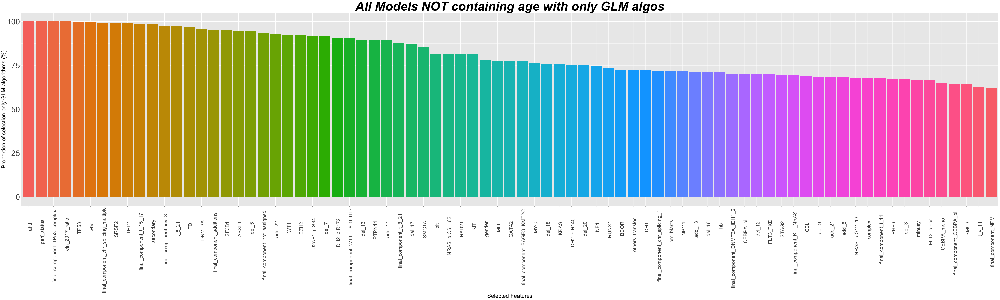

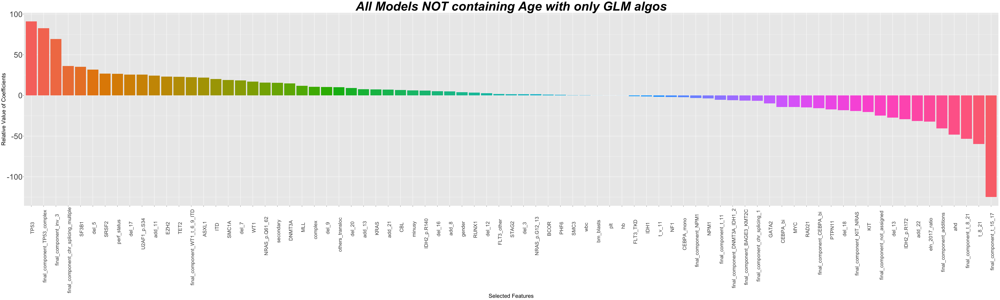

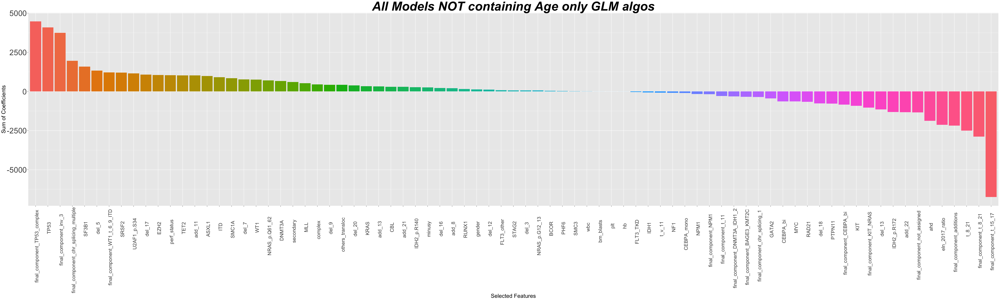

In [61]:
set_notebook_plot_size(50,15)
ggplot(na.omit(all_glm_without_age),aes(x=reorder(feature,-proportion_selected),y=proportion_selected))+geom_bar(stat = "identity", aes(fill = reorder(feature,-proportion_selected)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+
xlab("Selected Features") +ylab("Proportion of selection only GLM algorithms (%)") + ggtitle("All Models NOT containing age with only GLM algos")


ggplot(na.omit(all_glm_without_age),aes(x=reorder(feature,-proportion_coefficients),y=proportion_coefficients))+geom_bar(stat = "identity", aes(fill = reorder(feature,-proportion_coefficients)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Relative Value of Coefficients") + ggtitle("All Models NOT containing Age with only GLM algos")

ggplot(na.omit(all_glm_without_age),aes(x=reorder(feature,-sum_coef),y=sum_coef))+geom_bar(stat = "identity", aes(fill = reorder(feature,-sum_coef)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features")+ 
ylab("Sum of Coefficients") + ggtitle("All Models NOT containing Age only GLM algos")


# III- LOOK AT ALL MODELS CONTAINING FEATURE AGE AND COMPARE THEM WHEN WE REMOVE AGE FEATURE

eln 52 
clin 16 
gen 22 
cyto 16 
comp 34 
demo 64

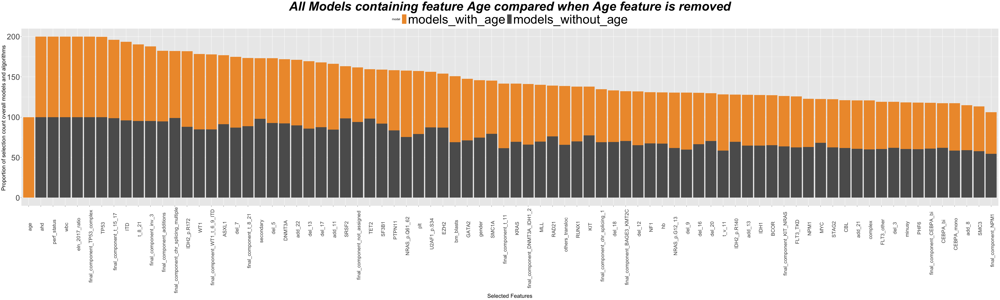

In [62]:
models_without_age <- df_bootstrap[grepl("_without_age",df_bootstrap$model_algo),]
models_without_age <- models_without_age[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
models_without_age$model <- "models_without_age"

models_with_age <- df_bootstrap[is.element(df_bootstrap$model_algo , gsub("_without_age", "", unique(df_bootstrap[grepl("_without_age",df_bootstrap$model_algo),]$model_algo))),]
models_with_age <- models_with_age[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum) 
models_with_age$model <- "models_with_age"

c_eln <- 0
c_clin <- 0
c_gen <- 0
c_cyto <- 0
c_comp <- 0
c_demo <- 0
for (l in unique(df_bootstrap[grepl("_without_age",df_bootstrap$model_algo),]$model_algo)){
    if (grepl("eln",l) ){
            c_eln <-c_eln + 1
        }
        if (grepl("clin",l)){
            c_clin <-c_clin + 1
        }
        if (grepl("gen",l)){
            c_gen <-c_gen + 1
        }
        if (grepl("cyto",l)){
            c_cyto <-c_cyto + 1
        }
        if (grepl("comp",l)){
            c_comp <-c_comp + 1
        }
        if (grepl("demo",l)){
            c_demo <-c_demo + 1
        }
    }

cat("eln",c_eln,"\n")
cat("clin",c_clin,"\n")
cat("gen",c_gen,"\n")
cat("cyto",c_cyto,"\n")
cat("comp",c_comp,"\n")
cat("demo",c_demo)

models_without_age$proportion_selected <- ifelse(is.element(models_without_age$feature , gen),models_without_age$num_selected/c_gen,
                                 ifelse(is.element(models_without_age$feature,cyto),models_without_age$num_selected/c_cyto,
                                       ifelse(is.element(models_without_age$feature,clin),models_without_age$num_selected/c_clin,
                                             ifelse(is.element(models_without_age$feature,comp),models_without_age$num_selected/c_comp,
                                                   ifelse(is.element(models_without_age$feature,eln),models_without_age$num_selected/c_eln,
                                                       ifelse(is.element(models_without_age$feature,demo),models_without_age$num_selected/c_demo,0))))))


models_with_age$proportion_selected <- ifelse(is.element(models_with_age$feature , gen ),models_with_age$num_selected/c_gen,
                                 ifelse(is.element(models_with_age$feature,cyto),models_with_age$num_selected/c_cyto,
                                       ifelse(is.element(models_with_age$feature,clin),models_with_age$num_selected/c_clin,
                                             ifelse(is.element(models_with_age$feature,comp),models_with_age$num_selected/c_comp,
                                                   ifelse(is.element(models_with_age$feature,eln),models_with_age$num_selected/c_eln,
                                                      ifelse(is.element(models_with_age$feature,demo),models_with_age$num_selected/c_demo,0))))))






tmp_with_without_age <-rbind(models_with_age,models_without_age)
ggplot(na.omit(tmp_with_without_age),aes(x=reorder(feature,-proportion_selected),y=proportion_selected,fill=model))+geom_bar(stat = "identity")+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.text=element_text(size=45),legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Proportion of selection count overall models and algorithms ") + ggtitle("All Models containing feature Age compared when Age feature is removed") + scale_fill_manual(values=c("#EE9937","#5C5C5C"))



eln 27 
clin 9 
gen 12 
cyto 9 
comp 18 
demo 33

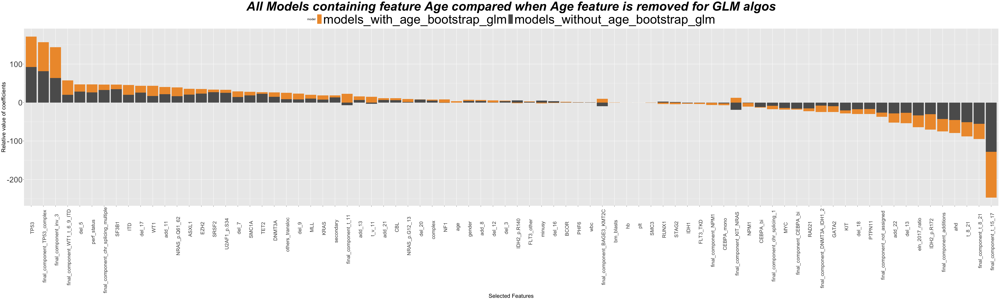

In [63]:
models_without_age_bootstrap_glm <- df_bootstrap[grepl("_without_age_bootstrap_glm",df_bootstrap$model_algo),]
models_without_age_bootstrap_glm <- models_without_age_bootstrap_glm[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
models_without_age_bootstrap_glm$model <- "models_without_age_bootstrap_glm"

models_with_age_bootstrap_glm <- df_bootstrap[is.element(df_bootstrap$model_algo , gsub("_without_age", "", unique(df_bootstrap[grepl("_without_age_bootstrap_glm",df_bootstrap$model_algo),]$model_algo))),]
models_with_age_bootstrap_glm <- models_with_age_bootstrap_glm[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum) 
models_with_age_bootstrap_glm$model <- "models_with_age_bootstrap_glm"

c_eln_bootstrap_glm <- 0
c_clin_bootstrap_glm <- 0
c_gen_bootstrap_glm <- 0
c_cyto_bootstrap_glm <- 0
c_comp_bootstrap_glm <- 0
c_demo_bootstrap_glm <- 0
for (l in unique(df_bootstrap[grepl("_without_age_bootstrap_glm",df_bootstrap$model_algo),]$model_algo)){
    if (grepl("eln",l) ){
            c_eln_bootstrap_glm <-c_eln_bootstrap_glm+1
        }
        if (grepl("clin",l)){
            c_clin_bootstrap_glm <-c_clin_bootstrap_glm+1
        }
        if (grepl("gen",l)){
            c_gen_bootstrap_glm <-c_gen_bootstrap_glm+1
        }
        if (grepl("cyto",l)){
            c_cyto_bootstrap_glm <-c_cyto_bootstrap_glm+1
        }
        if (grepl("comp",l)){
            c_comp_bootstrap_glm <-c_comp_bootstrap_glm+1
        }
        if (grepl("demo",l)){
            c_demo_bootstrap_glm <-c_demo_bootstrap_glm+1
        }
    }

cat("eln",c_eln_bootstrap_glm,"\n")
cat("clin",c_clin_bootstrap_glm,"\n")
cat("gen",c_gen_bootstrap_glm,"\n")
cat("cyto",c_cyto_bootstrap_glm,"\n")
cat("comp",c_comp_bootstrap_glm,"\n")
cat("demo",c_demo_bootstrap_glm)


models_without_age_bootstrap_glm$proportion_selected <- ifelse(is.element(models_without_age_bootstrap_glm$feature , gen),models_without_age_bootstrap_glm$num_selected/c_gen_bootstrap_glm,
                                 ifelse(is.element(models_without_age_bootstrap_glm$feature,cyto),models_without_age_bootstrap_glm$num_selected/c_cyto_bootstrap_glm,
                                       ifelse(is.element(models_without_age_bootstrap_glm$feature,clin),models_without_age_bootstrap_glm$num_selected/c_clin_bootstrap_glm,
                                             ifelse(is.element(models_without_age_bootstrap_glm$feature,comp),models_without_age_bootstrap_glm$num_selected/c_comp_bootstrap_glm,
                                                   ifelse(is.element(models_without_age_bootstrap_glm$feature,eln),models_without_age_bootstrap_glm$num_selected/c_eln_bootstrap_glm,
                                                       ifelse(is.element(models_without_age_bootstrap_glm$feature,demo),models_without_age_bootstrap_glm$num_selected/c_demo_bootstrap_glm,0))))))

models_without_age_bootstrap_glm$proportion_coefficients <- ifelse(is.element(models_without_age_bootstrap_glm$feature , gen),models_without_age_bootstrap_glm$sum_coef/c_gen_bootstrap_glm,
                                 ifelse(is.element(models_without_age_bootstrap_glm$feature,cyto),models_without_age_bootstrap_glm$sum_coef/c_cyto_bootstrap_glm,
                                       ifelse(is.element(models_without_age_bootstrap_glm$feature,clin),models_without_age_bootstrap_glm$sum_coef/c_clin_bootstrap_glm,
                                             ifelse(is.element(models_without_age_bootstrap_glm$feature,comp),models_without_age_bootstrap_glm$sum_coef/c_comp_bootstrap_glm,
                                                   ifelse(is.element(models_without_age_bootstrap_glm$feature,eln),models_without_age_bootstrap_glm$sum_coef/c_eln_bootstrap_glm,
                                                       ifelse(is.element(models_without_age_bootstrap_glm$feature,demo),models_without_age_bootstrap_glm$sum_coef/c_demo_bootstrap_glm,0))))))

models_with_age_bootstrap_glm$proportion_selected <- ifelse(is.element(models_with_age_bootstrap_glm$feature , gen),models_with_age_bootstrap_glm$num_selected/c_gen_bootstrap_glm,
                                 ifelse(is.element(models_with_age_bootstrap_glm$feature,cyto),models_with_age_bootstrap_glm$num_selected/c_cyto_bootstrap_glm,
                                       ifelse(is.element(models_with_age_bootstrap_glm$feature,clin),models_with_age_bootstrap_glm$num_selected/c_clin_bootstrap_glm,
                                             ifelse(is.element(models_with_age_bootstrap_glm$feature,comp),models_with_age_bootstrap_glm$num_selected/c_comp_bootstrap_glm,
                                                   ifelse(is.element(models_with_age_bootstrap_glm$feature,eln),models_with_age_bootstrap_glm$num_selected/c_eln_bootstrap_glm,
                                                       ifelse(is.element(models_with_age_bootstrap_glm$feature,demo),models_with_age_bootstrap_glm$num_selected/c_demo_bootstrap_glm,0))))))


models_with_age_bootstrap_glm$proportion_coefficients <- ifelse(is.element(models_with_age_bootstrap_glm$feature , gen),models_with_age_bootstrap_glm$sum_coef/c_gen_bootstrap_glm,
                                 ifelse(is.element(models_with_age_bootstrap_glm$feature,cyto),models_with_age_bootstrap_glm$sum_coef/c_cyto_bootstrap_glm,
                                       ifelse(is.element(models_with_age_bootstrap_glm$feature,clin),models_with_age_bootstrap_glm$sum_coef/c_clin_bootstrap_glm,
                                             ifelse(is.element(models_with_age_bootstrap_glm$feature,comp),models_with_age_bootstrap_glm$sum_coef/c_comp_bootstrap_glm,
                                                   ifelse(is.element(models_with_age_bootstrap_glm$feature,eln),models_with_age_bootstrap_glm$sum_coef/c_eln_bootstrap_glm,
                                                       ifelse(is.element(models_with_age_bootstrap_glm$feature,demo),models_with_age_bootstrap_glm$sum_coef/c_demo_bootstrap_glm,0))))))


tmp_with_without_age_glm <-rbind(models_with_age_bootstrap_glm,models_without_age_bootstrap_glm)



ggplot(na.omit(tmp_with_without_age_glm ),aes(x=reorder(feature,-proportion_coefficients),y=proportion_coefficients,fill=model))+geom_bar(stat = "identity")+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="top",legend.text=element_text(size=45),axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Relative value of coefficients") + ggtitle("All Models containing feature Age compared when Age feature is removed for GLM algos")+ scale_fill_manual(values=c("#EE9937","#5C5C5C"))


# IV- Take Model containing genetic and cyto and compare it with same model without genetic and cyto

### LOOK AT ALL MODELS CONTAINING FEATURE AGE AND COMPARE THEM WHEN WE REMOVE AGE FEATURE

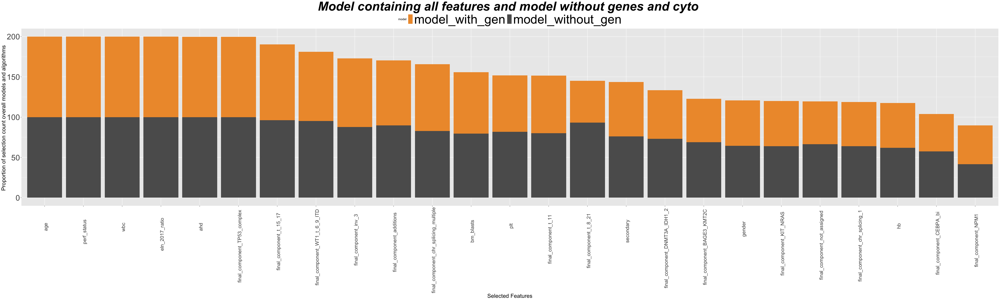

In [64]:



model_with_gen <- df_bootstrap[grepl("eln_comp_gen_cyto_clin_demo",df_bootstrap$model_algo) & (!grepl("without_age",df_bootstrap$model_algo)),]
model_with_gen <- model_with_gen[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
model_with_gen <- model_with_gen[!is.element(model_with_gen$feature,gen) & !is.element(model_with_gen$feature,cyto),]
model_with_gen$model <- "model_with_gen"

model_without_gen <- df_bootstrap[grepl("eln_comp_clin_demo",df_bootstrap$model_algo) & (!grepl("without_age",df_bootstrap$model_algo)),]
model_without_gen <- model_without_gen[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
model_without_gen$model <- "model_without_gen"



model_without_gen$proportion_selected <- ifelse(is.element(model_without_gen$feature,cyto),model_without_gen$num_selected/6,
                                               ifelse(is.element(model_without_gen$feature,clin),model_without_gen$num_selected/6,
                                                 ifelse(is.element(model_without_gen$feature,comp),model_without_gen$num_selected/6,
                                                   ifelse(is.element(model_without_gen$feature,eln),model_without_gen$num_selected/6,
                                                       ifelse(is.element(model_without_gen$feature,demo),model_without_gen$num_selected/6,0)))))



model_with_gen$proportion_selected <- ifelse(is.element(model_with_gen$feature , gen),model_with_gen$num_selected/6,
                                 ifelse(is.element(model_with_gen$feature,cyto),model_with_gen$num_selected/6,
                                       ifelse(is.element(model_with_gen$feature,clin),model_with_gen$num_selected/6,
                                             ifelse(is.element(model_with_gen$feature,comp),model_with_gen$num_selected/6,
                                                   ifelse(is.element(model_with_gen$feature,eln),model_with_gen$num_selected/6,
                                                      ifelse(is.element(model_with_gen$feature,demo),model_with_gen$num_selected/6,0))))))






tmp_with_without_gen <-rbind(model_with_gen,model_without_gen)
ggplot(na.omit(tmp_with_without_gen),aes(x=reorder(feature,-proportion_selected),y=proportion_selected,fill=model))+geom_bar(stat = "identity")+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.text=element_text(size=45),legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Proportion of selection count overall models and algorithms ") + ggtitle("Model containing all features and model without genes and cyto ") + scale_fill_manual(values=c("#EE9937","#5C5C5C"))


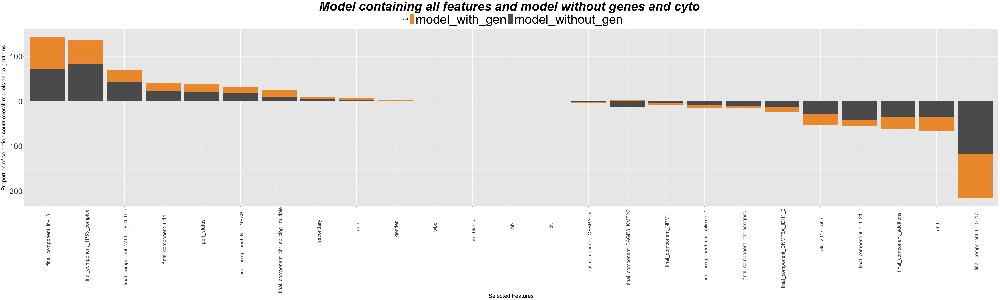

In [65]:
model_with_gen <- df_bootstrap[grepl("eln_comp_gen_cyto_clin_demo_bootstrap_glm",df_bootstrap$model_algo) & (!grepl("without_age",df_bootstrap$model_algo)),]
model_with_gen <- model_with_gen[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
model_with_gen <- model_with_gen[!is.element(model_with_gen$feature,gen) & !is.element(model_with_gen$feature,cyto),]
model_with_gen$model <- "model_with_gen"

model_without_gen <- df_bootstrap[grepl("eln_comp_clin_demo_bootstrap_glm",df_bootstrap$model_algo) & (!grepl("without_age",df_bootstrap$model_algo)),]
model_without_gen <- model_without_gen[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
model_without_gen$model <- "model_without_gen"



model_without_gen$proportion_coefficients <- ifelse(is.element(model_without_gen$feature,cyto),model_without_gen$sum_coef/3,
                                               ifelse(is.element(model_without_gen$feature,clin),model_without_gen$sum_coef/3,
                                                 ifelse(is.element(model_without_gen$feature,comp),model_without_gen$sum_coef/3,
                                                   ifelse(is.element(model_without_gen$feature,eln),model_without_gen$sum_coef/3,
                                                       ifelse(is.element(model_without_gen$feature,demo),model_without_gen$sum_coef/3,0)))))



model_with_gen$proportion_coefficients <- ifelse(is.element(model_with_gen$feature , gen),model_with_gen$sum_coef/3,
                                 ifelse(is.element(model_with_gen$feature,cyto),model_with_gen$sum_coef/3,
                                       ifelse(is.element(model_with_gen$feature,clin),model_with_gen$sum_coef/3,
                                             ifelse(is.element(model_with_gen$feature,comp),model_with_gen$sum_coef/3,
                                                   ifelse(is.element(model_with_gen$feature,eln),model_with_gen$sum_coef/3,
                                                      ifelse(is.element(model_with_gen$feature,demo),model_with_gen$sum_coef/3,0))))))






tmp_with_without_gen <-rbind(model_with_gen,model_without_gen)
ggplot(na.omit(tmp_with_without_gen),aes(x=reorder(feature,-proportion_coefficients),y=proportion_coefficients,fill=model))+geom_bar(stat = "identity")+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.text=element_text(size=45),legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Proportion of selection count overall models and algorithms ") + ggtitle("Model containing all features and model without genes and cyto ") + scale_fill_manual(values=c("#EE9937","#5C5C5C"))


# IV- Comparison all features coefficient and number of selection : ALL FEATURES WITH AGE AND WITHOUT AGE

In [67]:
all_features <- df_bootstrap[startsWith(df_bootstrap$model_algo,"eln_comp_gen_cyto_clin_demo_bootstrap_glm"),]
all_features <- all_features[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
all_features$proportion_selected <- all_features$num_selected /3
all_features$model <- "all_features"

all_features_without_age <- df_bootstrap[startsWith(df_bootstrap$model_algo,"eln_comp_gen_cyto_clin_demo_without_age_bootstrap_glm"),]
all_features_without_age <- all_features_without_age[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
all_features_without_age$proportion_selected <- all_features_without_age$num_selected /3
all_features_without_age$model <- "all_features_without_age"
tmp <-rbind(all_features,all_features_without_age)


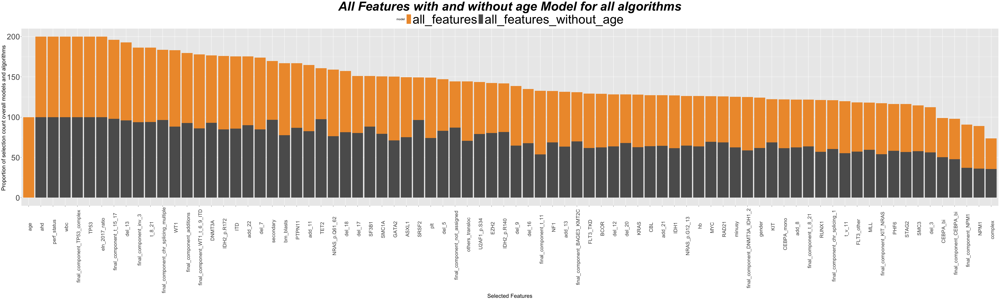

In [68]:
#tmp <-rbind(all_features,all_features_without_age)
ggplot(na.omit(tmp),aes(x=reorder(feature,-proportion_selected),y=proportion_selected,fill=model))+geom_bar(stat = "identity")+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.text=element_text(size=45),legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Proportion of selection count overall models and algorithms ") + ggtitle("All Features with and without age Model for all algorithms") + scale_fill_manual(values=c("#EE9937","#5C5C5C"))


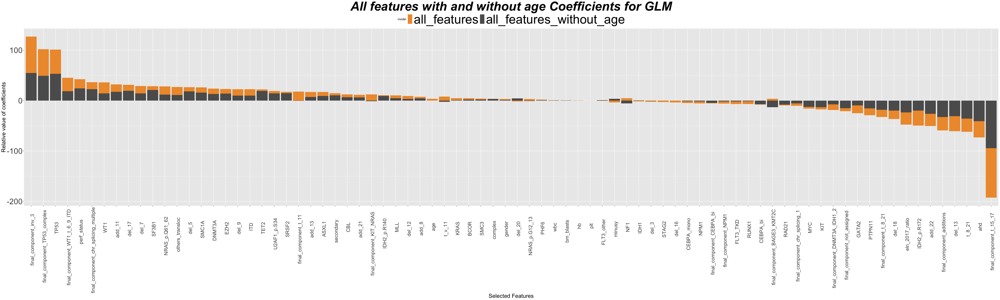

In [71]:
all_features_glm <- df_bootstrap[startsWith(df_bootstrap$model_algo,"eln_comp_gen_cyto_clin_demo_bootstrap_glm"),]
all_features_glm <- all_features_glm[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
all_features_glm$proportion_coefficients <- all_features_glm$sum_coef /3
all_features_glm$model <- "all_features"

all_features_without_age_glm <- df_bootstrap[startsWith(df_bootstrap$model_algo,"eln_comp_gen_cyto_clin_demo_without_age_bootstrap_glm"),]
all_features_without_age_glm <- all_features_without_age_glm[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
all_features_without_age_glm$proportion_coefficients <- all_features_without_age_glm$sum_coef /3
all_features_without_age_glm$model <- "all_features_without_age"
tmp_glm <-rbind(all_features_glm,all_features_without_age_glm)
set_notebook_plot_size(50,15)
ggplot(na.omit(tmp_glm),aes(x=reorder(feature,-proportion_coefficients),y=proportion_coefficients,fill=model))+geom_bar(stat = "identity")+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="top",legend.text=element_text(size=45),axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Relative value of coefficients") + ggtitle("All features with and without age Coefficients for GLM")+ scale_fill_manual(values=c("#EE9937","#5C5C5C"))


In [74]:
all_features <- df_bootstrap[startsWith(df_bootstrap$model_algo,"eln_comp_gen_cyto_clin_demo_bootstrap_glm"),]
all_features <- all_features[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
all_features$proportion_selected <- all_features$num_selected /3

all_features_without_age <- df_bootstrap[startsWith(df_bootstrap$model_algo,"eln_comp_gen_cyto_clin_demo_without_age_bootstrap_glm"),]
all_features_without_age <- all_features_without_age[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
all_features_without_age$proportion_selected <- all_features_without_age$num_selected /3

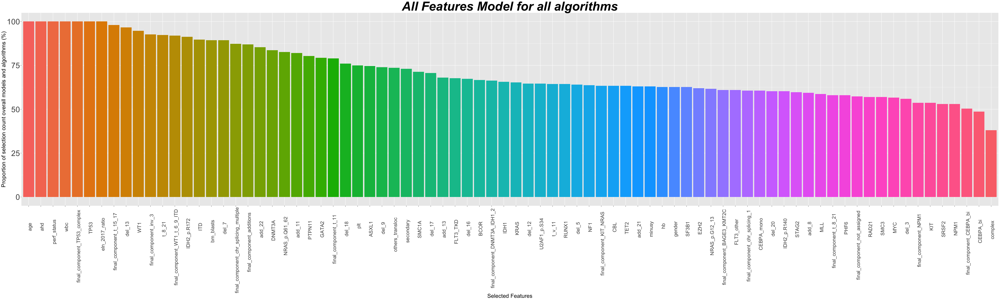

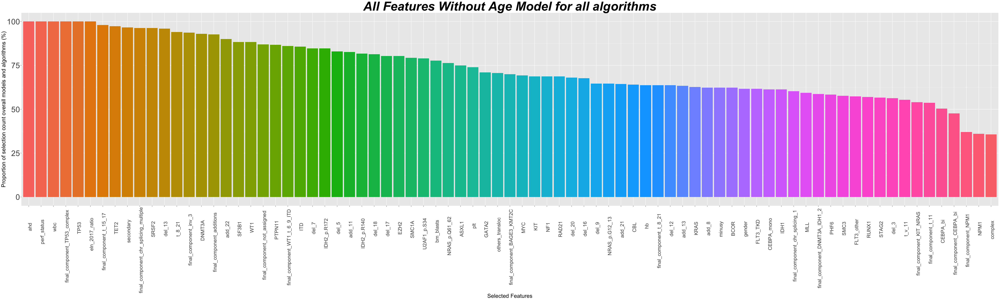

In [75]:
set_notebook_plot_size(50,15)
ggplot(na.omit(all_features),aes(x=reorder(feature,-proportion_selected),y=proportion_selected))+geom_bar(stat = "identity", aes(fill = reorder(feature,-proportion_selected)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Proportion of selection count overall models and algorithms (%)") + ggtitle("All Features Model for all algorithms")

ggplot(na.omit(all_features_without_age),aes(x=reorder(feature,-proportion_selected),y=proportion_selected))+geom_bar(stat = "identity", aes(fill = reorder(feature,-proportion_selected)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Proportion of selection count overall models and algorithms (%)") + ggtitle("All Features Without Age Model for all algorithms")

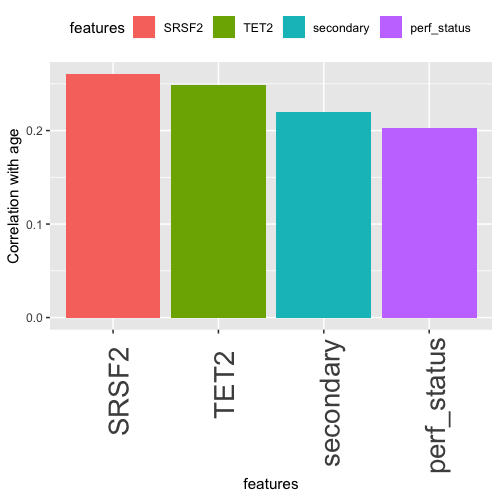

In [76]:
set_notebook_plot_size(5,5)
age <- data.frame(data.frame(rcorr(as.matrix(df_final[,1:163]),type='pearson')$r)$age,row.names=rownames(data.frame(rcorr(as.matrix(df_final[,1:163]))$r)))
colnames(age) <- "age_corr"
age$features <- rownames(age)
age <- age[age$age_corr>0.2 | age$age_corr< -0.2 ,]
age <- age[order(age$age_corr,decreasing=T),]
age$features <- factor(age$features, levels = age$features)
ggplot(age[age$features!="age",],aes(x=features,y=age_corr))+geom_bar(stat = "identity", aes(fill = features))+
theme(legend.position="top",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=20))+ylab("Correlation with age")

# IV - GENE AND CYTO

In [ ]:
read.table("../Bootstrap_coef/gen_cyto_b")

In [88]:
gen_cyto <- df_bootstrap[startsWith(df_bootstrap$model_algo,"gen_cyto_bootstrap"),]
gen_cyto <- gen_cyto[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
gen_cyto$proportion_selected <- gen_cyto$num_selected /6


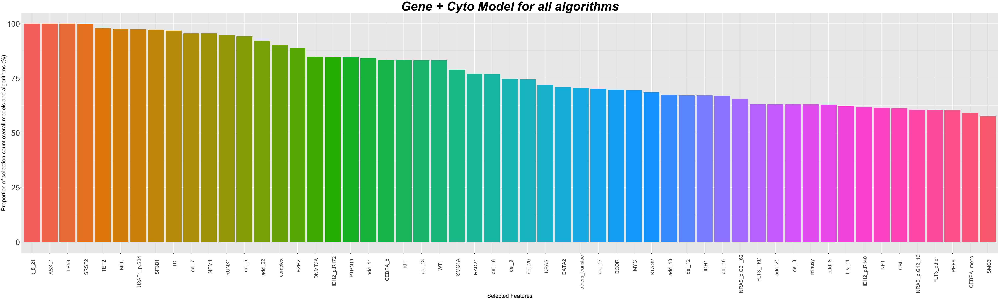

In [89]:
set_notebook_plot_size(50,15)
ggplot(na.omit(gen_cyto),aes(x=reorder(feature,-proportion_selected),y=proportion_selected))+geom_bar(stat = "identity", aes(fill = reorder(feature,-proportion_selected)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Proportion of selection count overall models and algorithms (%)") + ggtitle("Gene + Cyto Model for all algorithms")

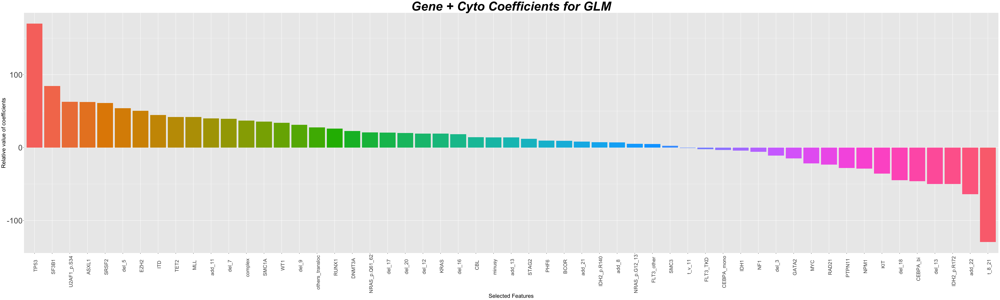

In [90]:
gen_cyto_glm <- df_bootstrap[startsWith(df_bootstrap$model_algo,"gen_cyto_bootstrap"),]
gen_cyto_glm <- gen_cyto_glm[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
gen_cyto_glm$proportion_coefficients <- gen_cyto_glm$sum_coef /3
set_notebook_plot_size(50,15)
ggplot(na.omit(gen_cyto_glm),aes(x=reorder(feature,-proportion_coefficients),y=proportion_coefficients))+geom_bar(stat = "identity", aes(fill = reorder(feature,-proportion_coefficients)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Relative value of coefficients") + ggtitle("Gene + Cyto Coefficients for GLM")

# ELN COMP

In [96]:
eln_comp <- df_bootstrap[startsWith(df_bootstrap$model_algo,"eln_comp_bootstrap"),]
eln_comp <- eln_comp[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
eln_comp
eln_comp$proportion_selected <- eln_comp$num_selected /6


feature,sum_coef,num_selected
final_component_additions,-276.49602,588
final_component_BAGE3_KMT2C,-86.71295,459
final_component_CEBPA_bi,-100.34760,380
final_component_chr_splicing_1,-101.32786,468
final_component_chr_splicing_multiple,132.61347,600
final_component_DNMT3A_IDH1_2,-104.13817,444
final_component_inv_3,245.35271,593
final_component_KIT_NRAS,-140.72145,421
final_component_not_assigned,-192.00976,590
final_component_NPM1,15.90617,428


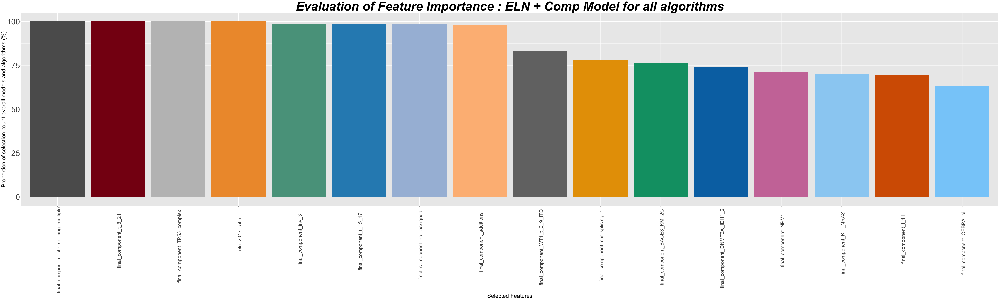

In [99]:
set_notebook_plot_size(50,15)
cols <- c("eln_2017_ratio" = "#EE9937", "final_component_chr_splicing_multiple" = "#5C5C5C", "final_component_t_8_21" = "#870C14", "final_component_TP53_complex" = "#BFBFBF",
         "final_component_inv_3" = "#59A08B", "final_component_t_15_17" = "#2b8cbe", "final_component_not_assigned" = "#a6bddb", "final_component_additions" = "#fdbb84",
         "final_component_WT1_t_6_9_ITD" = "grey45", "final_component_chr_splicing_1" = "#e79f00", "final_component_BAGE3_KMT2C" = "#009E73", "final_component_DNMT3A_IDH1_2" = "#0072B2",
         "final_component_NPM1" = "#CC79A7", "final_component_KIT_NRAS" = "#9ad0f3", "final_component_t_11" = "#D55E00", "final_component_CEBPA_bi" = "lightskyblue")
ggplot(na.omit(eln_comp),aes(x=reorder(feature,-proportion_selected),y=proportion_selected))+geom_bar(stat = "identity", aes(fill = reorder(feature,-proportion_selected)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Proportion of selection count overall models and algorithms (%)") + ggtitle("Evaluation of Feature Importance : ELN + Comp Model for all algorithms")+scale_fill_manual(values = cols)

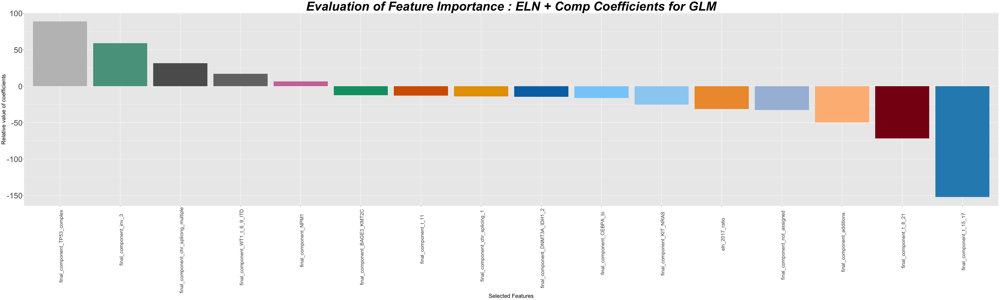

In [100]:
eln_comp_glm <- df_bootstrap[startsWith(df_bootstrap$model_algo,"eln_comp_bootstrap_glm"),]
eln_comp_glm <- eln_comp_glm[,c('feature','sum_coef','num_selected')] %>% group_by(feature) %>% summarize_all(sum)
eln_comp_glm$proportion_coefficients <- eln_comp_glm$sum_coef /3
set_notebook_plot_size(50,15)
ggplot(na.omit(eln_comp_glm),aes(x=reorder(feature,-proportion_coefficients),y=proportion_coefficients))+geom_bar(stat = "identity", aes(fill = reorder(feature,-proportion_coefficients)))+
theme(plot.title = element_text( size=45, face="bold.italic",hjust=0.5),legend.position="none",axis.text.x = element_text(angle = 90, hjust = 0.8,vjust=0.8,size=18),axis.text.y=element_text(size=28),axis.title.y = element_text(size = 20),axis.title.x = element_text(size = 20))+xlab("Selected Features") +
ylab("Relative value of coefficients") + ggtitle("Evaluation of Feature Importance : ELN + Comp Coefficients for GLM")+scale_fill_manual(values = cols)